<a href="https://colab.research.google.com/github/Alok-Kumar2005/Simple-ML-DL-Projects./blob/main/plant_disease.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/image/keras/default/1/tomato.jpeg
/kaggle/input/plant-diseases-training-dataset/data/Corn___northern_leaf_blight/919505a0-7e06-4a89-8faf-f308bd644a6a___RS_NLB 4141.JPG
/kaggle/input/plant-diseases-training-dataset/data/Corn___northern_leaf_blight/efb9c96a-22d4-4217-bf2b-7c0f5d97d277___RS_NLB 4057 copy 2.jpg
/kaggle/input/plant-diseases-training-dataset/data/Corn___northern_leaf_blight/d1fbc905-f7df-4f45-b228-0a94b00f16ee___RS_NLB 3488.JPG
/kaggle/input/plant-diseases-training-dataset/data/Corn___northern_leaf_blight/cbd7b12a-7a46-4493-bba9-4712c54a3657___RS_NLB 3700.JPG
/kaggle/input/plant-diseases-training-dataset/data/Corn___northern_leaf_blight/0d0f6d14-be5c-4cb8-adb4-2cfd4d5f8540___RS_NLB 3642.JPG
/kaggle/input/plant-diseases-training-dataset/data/Corn___northern_leaf_blight/b761537f-f90f-43a6-a816-6d515dfa0e26___RS_NLB 3797.JPG
/kaggle/input/plant-diseases-training-dataset/data/Corn___northern_leaf_blight/d36dfeef-82b0-4bfc-b202-0abe50242a21___RS_NLB 3928.JPG
/kaggle

In [ ]:
import random
random.seed(0)

import numpy as np
np.random.seed(0)

import tensorflow as tf
tf.random.set_seed(0)

In [ ]:
import os
import json
from PIL import Image

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models

(256, 256, 3)


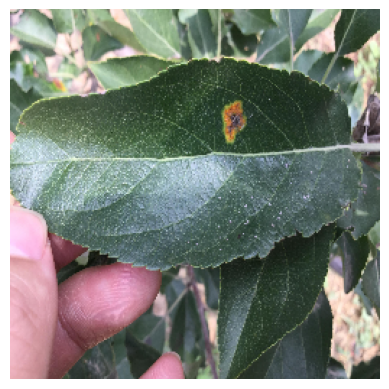

In [ ]:
image_path = '/kaggle/input/plant-diseases-training-dataset/data/Apple___rust/004129.JPG'

# Read the image
img = mpimg.imread(image_path)

print(img.shape)
# Display the image
plt.imshow(img)
plt.axis('off')  # Turn off axis numbers
plt.show()

In [ ]:
# Image Parameters
img_size = 224
batch_size = 32

#base dir
base_dir = '/kaggle/input/plant-diseases-training-dataset/data'

In [ ]:
# train test split
# Image Data Generators
data_gen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2  # Use 20% of data for validation
)


In [ ]:
# Train Generator   # it will autometically take data from dataset
train_generator = data_gen.flow_from_directory(
    base_dir,
    target_size=(img_size, img_size),
    batch_size=batch_size,
    subset='training',
    class_mode='categorical'
)


Found 76395 images belonging to 60 classes.


In [ ]:
validation_generator = data_gen.flow_from_directory(
    base_dir,
    target_size=(img_size, img_size),
    batch_size=batch_size,
    subset='validation',
    class_mode='categorical'
)

Found 19073 images belonging to 60 classes.


In [ ]:
from keras.layers import Flatten, Dense
from keras.models import Model
from keras.applications.mobilenet import MobileNet
from keras.callbacks import ModelCheckpoint, EarlyStopping
import tensorflow as tf
from tensorflow import keras

# Base model
base_model = MobileNet(input_shape=(224, 224, 3), include_top=False, weights='imagenet')

# Freeze base model layers
for layer in base_model.layers:
    layer.trainable = False

# Define new model
X = Flatten()(base_model.output)
X = Dense(128, activation='relu')(X)  # Optional additional Dense layer for more complexity
X = Dense(60, activation='softmax')(X)  # Updated for multi-class classification
model = Model(inputs=base_model.input, outputs=X)

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print model summary
model.summary()


17225924/17225924 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1 (Conv2D)                  │ (None, 112, 112, 32)   │           864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_bn (BatchNormalization)   │ (None, 112, 112, 32)   │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_relu (ReLU)               │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1 (DepthwiseConv2D)     │ (None, 112, 112, 32)   │           288 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1_bn                    │ (None, 112, 112, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1_relu (ReLU)           │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1 (Conv2D)              │ (None, 112, 112, 64)   │         2,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1_bn                    │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1_relu (ReLU)           │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pad_2 (ZeroPadding2D)      │ (None, 113, 113, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2 (DepthwiseConv2D)     │ (None, 56, 56, 64)     │           576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2_bn                    │ (None, 56, 56, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2_relu (ReLU)           │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2 (Conv2D)              │ (None, 56, 56, 128)    │         8,192 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2_bn                    │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2_relu (ReLU)           │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3 (DepthwiseConv2D)     │ (None, 56, 56, 128)    │         1,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3_bn                    │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3_relu (ReLU)           │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_3 (Conv2D)              │ (None, 56, 56, 128)    │        16,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_3_bn                    │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │             

 Total params: 9,659,260 (36.85 MB)

 Trainable params: 6,430,396 (24.53 MB)

 Non-trainable params: 3,228,864 (12.32 MB)

In [ ]:
# Callbacks
mc = ModelCheckpoint(
    monitor='val_accuracy',
    filepath='bestmodel.keras',
    verbose=1,
    save_best_only=True,
    mode='auto'
)
es = EarlyStopping(
    monitor='val_accuracy',
    min_delta=0.01,
    patience=3,
    verbose=1,
    mode='auto'
)
cb = [es, mc]

# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // batch_size,
    epochs=100,
    verbose=1,
    callbacks=cb,
    validation_data=validation_generator,
    validation_steps=16
)

Epoch 1/100


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1726229090.240933      81 service.cc:145] XLA service 0x7845b80045d0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1726229090.241001      81 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


   1/2387 ━━━━━━━━━━━━━━━━━━━━ 5:30:55 8s/step - accuracy: 0.0000e+00 - loss: 5.8177

I0000 00:00:1726229093.741094      81 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


2387/2387 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.6112 - loss: 1.5730
Epoch 1: val_accuracy improved from -inf to 0.77344, saving model to bestmodel.keras
2387/2387 ━━━━━━━━━━━━━━━━━━━━ 450s 185ms/step - accuracy: 0.6112 - loss: 1.5728 - val_accuracy: 0.7734 - val_loss: 0.8290
Epoch 2/100
   1/2387 ━━━━━━━━━━━━━━━━━━━━ 52s 22ms/step - accuracy: 0.7812 - loss: 1.4296

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)



Epoch 2: val_accuracy improved from 0.77344 to 0.78711, saving model to bestmodel.keras
2387/2387 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - accuracy: 0.7812 - loss: 1.4296 - val_accuracy: 0.7871 - val_loss: 0.8527
Epoch 3/100
2387/2387 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - accuracy: 0.8453 - loss: 0.4641
Epoch 3: val_accuracy improved from 0.78711 to 0.79297, saving model to bestmodel.keras
2387/2387 ━━━━━━━━━━━━━━━━━━━━ 263s 110ms/step - accuracy: 0.8453 - loss: 0.4641 - val_accuracy: 0.7930 - val_loss: 0.9410
Epoch 4/100
   1/2387 ━━━━━━━━━━━━━━━━━━━━ 50s 21ms/step - accuracy: 0.8438 - loss: 0.3363
Epoch 4: val_accuracy improved from 0.79297 to 0.80273, saving model to bestmodel.keras
2387/2387 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - accuracy: 0.8438 - loss: 0.3363 - val_accuracy: 0.8027 - val_loss: 0.8420
Epoch 5/100
2387/2387 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - accuracy: 0.8804 - loss: 0.3602
Epoch 5: val_accuracy improved from 0.80273 to 0.80859, saving model to bestmodel.keras
2387/2387 ━━━

In [ ]:
# Model Evaluation
print("Evaluating model...")
val_loss, val_accuracy = model.evaluate(validation_generator, steps=validation_generator.samples // batch_size)
print(f"Validation Accuracy: {val_accuracy * 100:.2f}%")

Evaluating model...
596/596 ━━━━━━━━━━━━━━━━━━━━ 103s 173ms/step - accuracy: 0.8068 - loss: 1.2569
Validation Accuracy: 80.90%


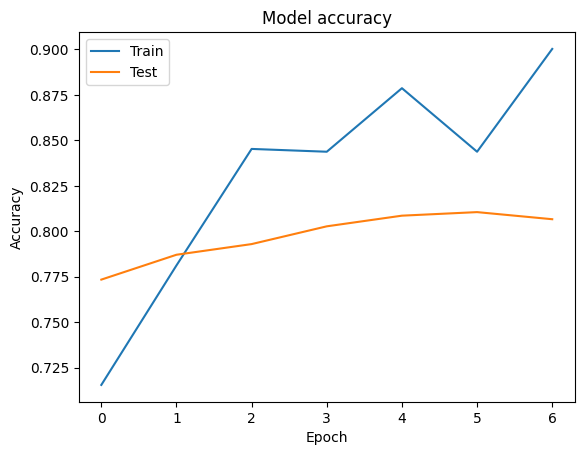

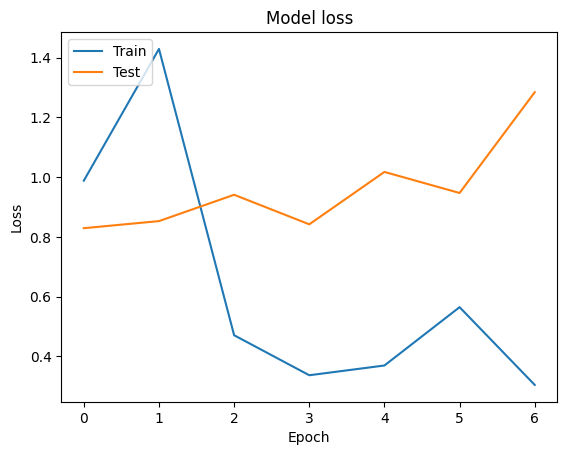

In [ ]:
# Plot training & validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [ ]:
model.save('plant_disease.h5')

In [ ]:
# Create a mapping from class indices to class names
class_indices = {v: k for k, v in train_generator.class_indices.items()}

class_indices

{0: 'Apple___alternaria_leaf_spot',
 1: 'Apple___black_rot',
 2: 'Apple___brown_spot',
 3: 'Apple___gray_spot',
 4: 'Apple___healthy',
 5: 'Apple___rust',
 6: 'Apple___scab',
 7: 'Bell_pepper___bacterial_spot',
 8: 'Bell_pepper___healthy',
 9: 'Blueberry___healthy',
 10: 'Cassava___bacterial_blight',
 11: 'Cassava___brown_streak_disease',
 12: 'Cassava___green_mottle',
 13: 'Cassava___healthy',
 14: 'Cassava___mosaic_disease',
 15: 'Cherry___healthy',
 16: 'Cherry___powdery_mildew',
 17: 'Corn___common_rust',
 18: 'Corn___gray_leaf_spot',
 19: 'Corn___healthy',
 20: 'Corn___northern_leaf_blight',
 21: 'Grape___black_measles',
 22: 'Grape___black_rot',
 23: 'Grape___healthy',
 24: 'Grape___leaf_blight',
 25: 'Orange___citrus_greening',
 26: 'Peach___bacterial_spot',
 27: 'Peach___healthy',
 28: 'Potato___bacterial_wilt',
 29: 'Potato___early_blight',
 30: 'Potato___healthy',
 31: 'Potato___late_blight',
 32: 'Potato___nematode',
 33: 'Potato___pests',
 34: 'Potato___phytophthora',
 35: 

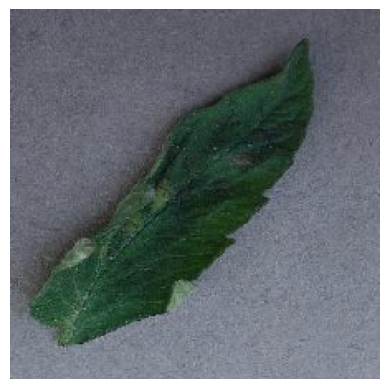

Shape of input array: (224, 224, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Predicted class index: 55
Predicted class probability: 0.5926909
Predicted class name: Tomato___leaf_mold


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from keras.preprocessing.image import img_to_array, load_img
from keras.applications.mobilenet import preprocess_input

# Define the image path
path = "/kaggle/input/plant-diseases-training-dataset/data/Tomato___leaf_mold/030ea180-4eb5-4f91-918e-56c7cfe2c001___Crnl_L.Mold 7076.JPG"

# Load and preprocess the image
img = load_img(path, target_size=(224,224))
input_arr = img_to_array(img)
input_arr = preprocess_input(input_arr)  # Use the preprocessing function for MobileNet

# Visualize the image
plt.imshow((input_arr + 1) / 2)  # Display the image with correct scaling; MobileNet preprocess_input can result in values in [-1, 1]
plt.axis('off')  # Hide axis
plt.show()

# Check the shape of the array
print("Shape of input array:", input_arr.shape)

# Add a batch dimension
input_arr = np.expand_dims(input_arr, axis=0)

# Make prediction
predictions = model.predict(input_arr)

# Get the predicted class
predicted_class_index = np.argmax(predictions[0])  # Get the index of the highest probability
predicted_class_probability = np.max(predictions[0])  # Get the probability of the predicted class

print("Predicted class index:", predicted_class_index)
print("Predicted class probability:", predicted_class_probability)

# Map predicted class index to class name (assuming you have a list of class names)
class_names = class_indices
predicted_class_name = class_names[predicted_class_index]

print("Predicted class name:", predicted_class_name)